### **1. The difference between Multilayer Perception (MLP) and Recurent Neural Networks (RNNs)**

###- MLP is one of the simplest types of neural networks and a class of feed-forward artificial neural networks (ANNs) that consists of a series of fully connected layers, but RNN is one of the most advanced and complex neural networks that use sequential data feeding.
###- In MLP, information flows in a single direction, while in RNN it flows in different directions, which gives it its memory and self-learning.
###- MLP takes a vector as input and RNN was developed to solve the time series problem of sequential input data.
###- MLP is able to handle linearly separable and non-linearly separable data and is good for simple image classification, but RNN is good in time series problems and NLP tasks sequence of words in a sentence for NLP or sequence of sounds in speech recognition or processing.

##**2. The different basic types of RNN cells**

###According to Tensorflow documentation, “An RNN cell, in the most abstract setting, is anything that has a state and performs some operation that takes a matrix of inputs.”

###RNN cells distinguish themselves from the regular neurons in the sense that they have a state and thus can remember information from the past. RNN cells form the backbone of recurrent networks.

###There are three embedded RNN cells, each corresponding to the corresponding RNN layer.
###-the SimpleRNN : SimpleRNN that has a backflow in the input node.

###-GRU layer: A GRU layer learns the dependencies between time steps in time series and sequence data. The hidden state of the layer at time step t contains the output of the GRU layer for that time step. At each time step, the layer adds information to or removes information from the state layers.

###-LSTM layer: An LSTM layer learns the long-term dependencies between time steps in time series and sequence data. The layer performs additive interactions, which can help improve the gradient flow over long sequences during training.

##**3. The vanishing gradient problem**

###In a neural network that contains several layers, the value of the product of the derivatives decreases until at some point the partial derivative of the loss function approaches a value close to zero, and the partial derivative vanishes. 

##**4. The difference between LSTM and RNN**

###- Rnn's store all information, whether it is important or not.
###- Long-term memory networks (LSTMs) are an extension of recurrent neural networks, which basically extend memory. Therefore, they are well suited for learning important experiences that have a very long time lag.
###- LSTMs allow RNNs to remember inputs over a long period of time.  The LSTM can read, write, and delete information from its memory.
###- In a long-term short-term memory cell, there are three gates: an input gate, a forgetting gate, and an output gate. These gates determine whether or not to let in new input (input gate), delete the information because it is not important (forget gate), or let it impact output in the present moment (output gate).
###The main difference between RNN and LSTM is that they hold information in memory for a long period of time. Here, LSTM has an advantage over RNN because LSTM can handle the information in memory for a long period of time compared to RNN.

###- RNNs have feedback loops in the recurrent layer. This allows them to maintain information in "memory" over time. But it can be difficult to train standard RNNs to solve problems that require learning long-term temporal dependencies.
###This is because the gradient of the loss function decreases exponentially with time (this is called the evanescent gradient problem).

###- But LSTM networks are a type of RNN that uses special units in addition to the standard units. LSTM units include a "memory cell" that can hold information in memory for long periods. This memory cell allows them to learn longer term dependencies.
###- LSTMs address the problem of gradient fading and bursting by introducing new gates, such as input and oblivion gates, that allow for better control of gradient flow and better preservation of "longer-term dependencies."

#**Part II: Gold dataset**

In [1]:
import warnings
warnings.filterwarnings("ignore")

In [2]:
import pandas as pd
import numpy as np
import tensorflow as tf
import os
from sklearn.preprocessing import MinMaxScaler
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error

In [3]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, InputLayer
from tensorflow.keras.callbacks import ModelCheckpoint
from tensorflow.keras.losses import MeanSquaredError
from tensorflow.keras.metrics import RootMeanSquaredError
from tensorflow.keras.optimizers import Adam
from google.colab import files
upload = files.upload()

Saving Gold Price.csv to Gold Price.csv


In [4]:
#NetworkX
import networkx as nx
import plotly.graph_objects as go #To construct network graphs

#**1-explore the gold data in general, and pick a time series to work on (typically ”closing” column)**

In [5]:
df = pd.read_csv('Gold Price.csv')
df.head()

,Date,Price,Open,High,Low,Volume,Chg%
0,2014-01-01,29542,29435,29598,29340,2930,0.25
1,2014-01-02,29975,29678,30050,29678,3140,1.47
2,2014-01-03,29727,30031,30125,29539,3050,-0.83
3,2014-01-04,29279,29279,29279,29279,0,-1.51
4,2014-01-06,29119,29300,29395,29051,24380,-0.55


In [6]:
def basic_eda(df):
    print("-------------------------------TOP 5 RECORDS-----------------------------")
    print(df.head(5))
    print()
    
    print("-------------------------------INFO--------------------------------------")
    print(df.info())
    print()
    
    print("-------------------------------Describe----------------------------------")
    print(df.describe())
    print()
    
    print("-------------------------------Columns-----------------------------------")
    print(df.columns)
    print()
    
    print("-------------------------------Data Types--------------------------------")
    print(df.dtypes)
    print()
    
    print("----------------------------Missing Values-------------------------------")
    print(df.isnull().sum())
    print()
    
    print("----------------------------NULL values----------------------------------")
    print(df.isna().sum())
    print()
    
    print("--------------------------Shape Of Data---------------------------------")
    print(df.shape)
    print()

    print("_________________________ duplicated data______________________")
    print(f"Dataset has {df.duplicated().sum()} duplicated data")
    print()

    print("============================================================================ \n")


In [7]:
basic_eda(df)

-------------------------------TOP 5 RECORDS-----------------------------
         Date  Price   Open   High    Low  Volume  Chg%
0  2014-01-01  29542  29435  29598  29340    2930  0.25
1  2014-01-02  29975  29678  30050  29678    3140  1.47
2  2014-01-03  29727  30031  30125  29539    3050 -0.83
3  2014-01-04  29279  29279  29279  29279       0 -1.51
4  2014-01-06  29119  29300  29395  29051   24380 -0.55

-------------------------------INFO--------------------------------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2227 entries, 0 to 2226
Data columns (total 7 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   Date    2227 non-null   object 
 1   Price   2227 non-null   int64  
 2   Open    2227 non-null   int64  
 3   High    2227 non-null   int64  
 4   Low     2227 non-null   int64  
 5   Volume  2227 non-null   int64  
 6   Chg%    2227 non-null   float64
dtypes: float64(1), int64(5), object(1)
memory usage: 121.9+ KB
None

------

###**Interpretation: the dimension of the data is 2227 rows and 7 columns with an absence of null values, missing values and duplicated data**


##- La visualisation du data

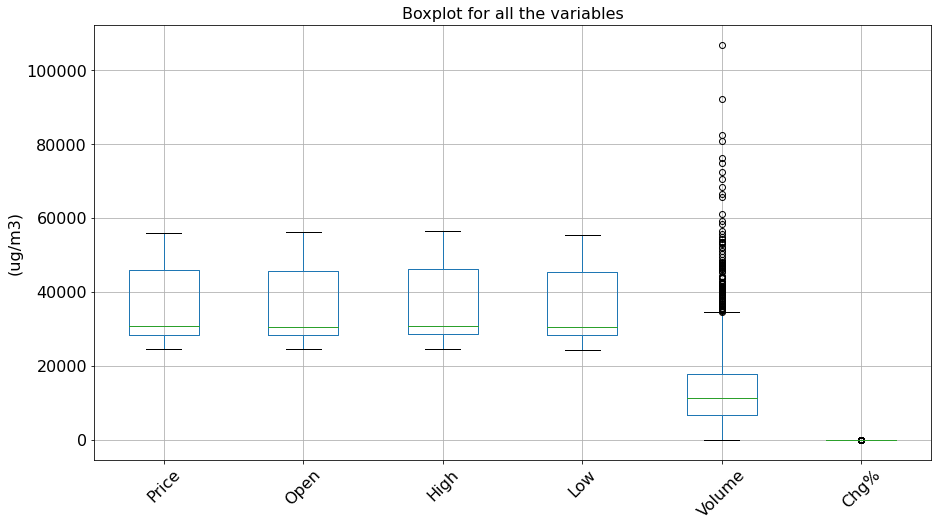

In [8]:
import matplotlib.pyplot as plt
boxplot = df.boxplot( figsize=(15, 8), rot=45, fontsize=16)
plt.title('Boxplot for all the variables',fontsize=16)
plt.ylabel('(ug/m3)', fontsize=16)
plt.show()

###**Interpretation: the Volume column contains a large number of missing values and in order to mitigate their effect we can normalize this column**.

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7f603b313280>,
      dtype=object)

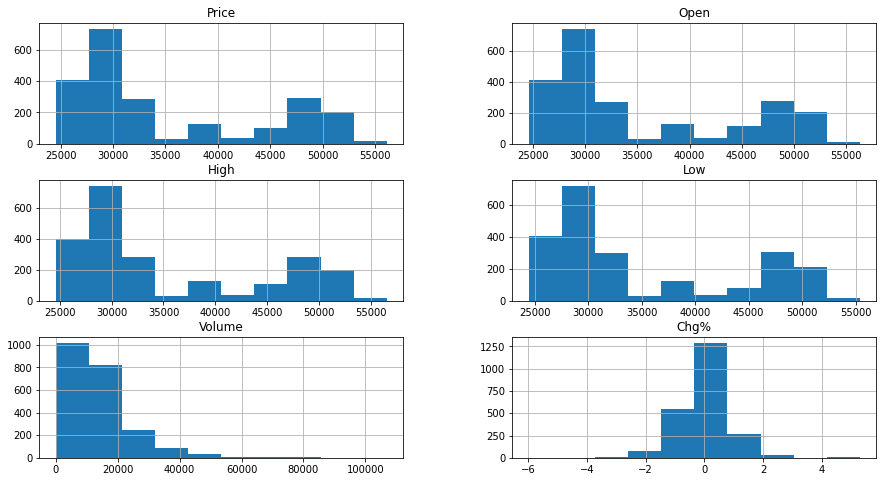

In [9]:
df.hist(figsize=(15,8))

##- la correlation de pearson

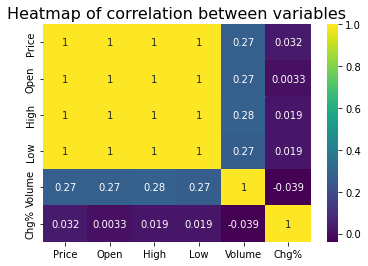

In [10]:
import seaborn as sns
#rcParams['figure.figsize']=15,8
sns.heatmap(df.corr(),annot=True,cmap='viridis')
plt.title('Heatmap of correlation between variables',fontsize=16)
plt.show()

##- Correlation Network

In [11]:
corr=df.corr()
indices = corr.index.values
cor_matrix = np.asmatrix(corr)
G = nx.from_numpy_matrix(cor_matrix)
G = nx.relabel_nodes(G,lambda x: indices[x])

In [12]:
def corr_network(G, corr_direction, min_correlation):
    H = G.copy()

    for s1, s2, weight in G.edges(data=True):       
        if corr_direction == "positive":
            if weight["weight"] < 0 or weight["weight"] < min_correlation:
                H.remove_edge(s1, s2)
        else:
            if weight["weight"] >= 0 or weight["weight"] > min_correlation:
                H.remove_edge(s1, s2)
                
    edges,weights = zip(*nx.get_edge_attributes(H,'weight').items())
    weights = tuple([(1+abs(x))**2 for x in weights])
   
    d = dict(nx.degree(H))
    nodelist=d.keys()
    node_sizes=d.values()
    
    positions=nx.circular_layout(H)
    
    plt.figure(figsize=(9,9))

    nx.draw_networkx_nodes(H,positions,node_color='#d100d1',nodelist=nodelist,
                       node_size=tuple([x**2 for x in node_sizes]),alpha=0.8)

    nx.draw_networkx_labels(H, positions, font_size=13)

    if corr_direction == "positive":
        edge_colour = plt.cm.summer 
    else:
        edge_colour = plt.cm.autumn
        
    nx.draw_networkx_edges(H, positions, edgelist=edges,style='solid',
                          width=weights, edge_color = weights, edge_cmap = edge_colour,
                          edge_vmin = min(weights), edge_vmax=max(weights))
    plt.axis('off')
    plt.show() 

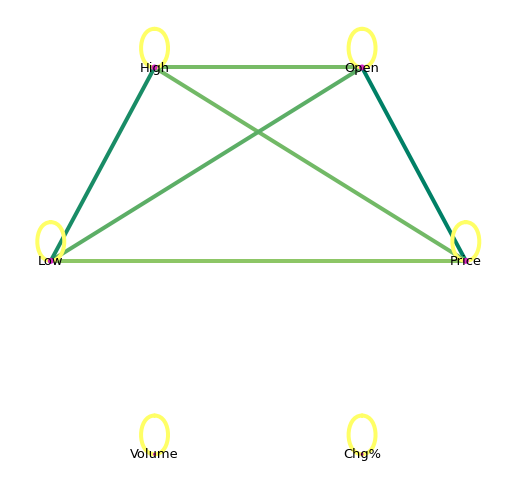

In [13]:
corr_network(G, corr_direction="positive",min_correlation = 0.5)


###**Interpretation: There is a strong correlation between the target variable "Price" and the features "low" , "open" and "High "**.

##**Autocorrelation ,Seasonality , Stationarity , Trend**

###There are multiple implementations of Unit Root tests like:
###- Augmented Dickey Fuller test (ADH Test)
###- Kwiatkowski-Phillips-Schmidt-Shin – KPSS test (trend stationary)
###- Philips Perron test (PP Test)

###**- Trend**

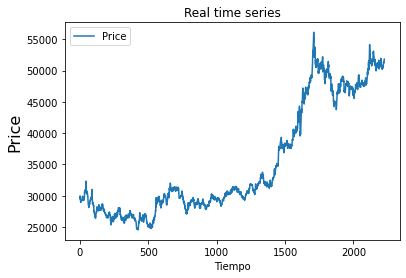

In [14]:
data = df[['Date','Price']]
data.set_index('Date')
df_O3 = data.copy()
df_O3.plot()
plt.title('Real time series')
plt.xlabel('Tiempo')
plt.ylabel('Price', fontsize=16)
plt.savefig('real.png')
plt.show()

###**Interpretation: From the graph we can see that there is a trend in the Price column**.

In [15]:
import statsmodels
from statsmodels.tsa.stattools import coint, adfuller
from statsmodels.tsa.seasonal import seasonal_decompose

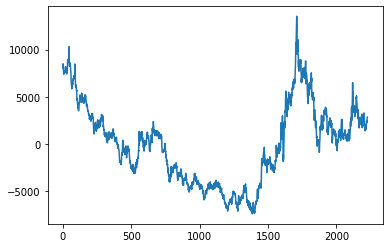

In [16]:
from scipy import signal
#df = train[(train['country']=='Belgium')&(train['product']=='Kaggle Advanced Techniques')&(train['store']=='KaggleMart')]
detrended = signal.detrend(df.Price.values)
plt.plot(detrended)

###Detrending a time series is to remove the trend component from a time series.There are multiple approaches:
###- Subtract the trend component obtained from time series decomposition we saw earlier.
###- Subtract the mean
###- Apply a filter like Baxter-King filter(statsmodels.tsa.filters.bkfilter) or the Hodrick-Prescott Filter (statsmodels.tsa.filters.hpfilter) to remove the moving average trend lines or the cyclical components.

###**- Seasonality**

###The common way is to plot the series and check for repeatable patterns in fixed time intervals. So, the types of seasonality is determined by the clock or the calendar:
- Hour of day
- Day of month
- Weekly
- Monthly
- Yearly

###**- Autocorrelation**

[]

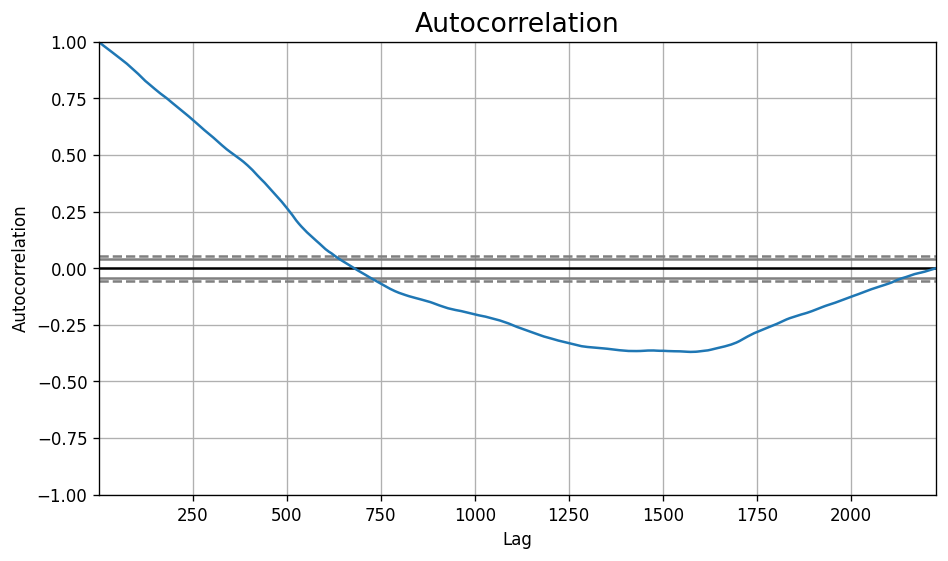

In [17]:
from pandas.plotting import autocorrelation_plot
from matplotlib.pylab import rcParams

plt.rcParams.update({'figure.figsize':(9,5), 'figure.dpi':120})
autocorrelation_plot(df.Price.tolist())
plt.title('Autocorrelation', fontsize=16)
plt.plot()

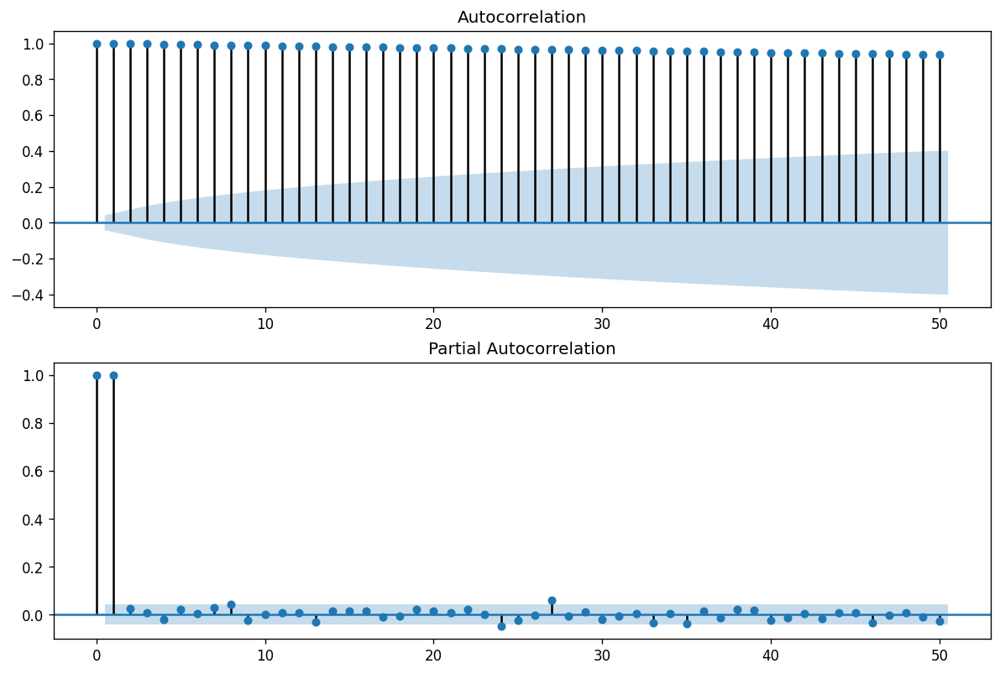

In [18]:
import statsmodels.api as sm
fig = plt.figure(figsize=(12,8))
ax1 = fig.add_subplot(211)
fig = sm.graphics.tsa.plot_acf(data["Price"].iloc[13:], lags=50, ax=ax1)
ax2 = fig.add_subplot(212)
fig = sm.graphics.tsa.plot_pacf(data["Price"].iloc[13:], lags=50, ax=ax2)
plt.savefig('correlation.png')
plt.show()

###**- Stationarity**

###- Forecasting a stationary series is relatively easy and the forecasts are more reliable.


Text(0.5, 1.0, '\n Golde Price \n')

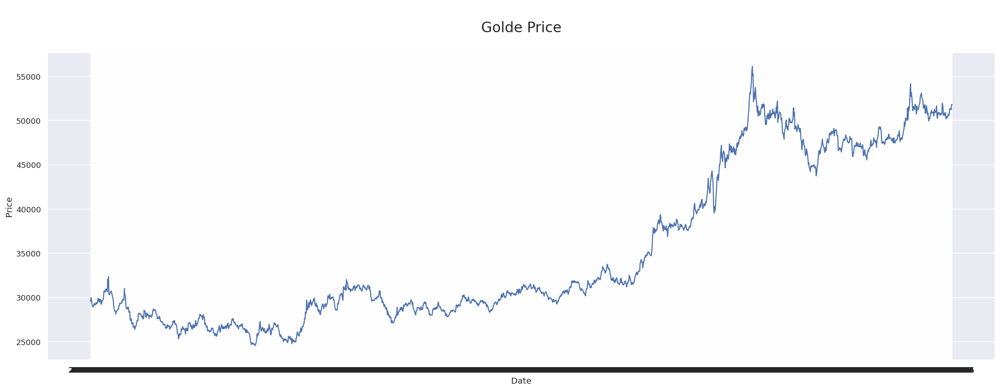

In [19]:
sns.set(rc={'figure.figsize':(24,8)})
ax=sns.lineplot(data=data,x='Date',y='Price')
ax.axes.set_title("\n Golde Price \n",fontsize=20)

### Augmented Dickey Fuller test (ADH Test)

In [20]:
from statsmodels.tsa.stattools import adfuller
result = adfuller(data.Price, autolag='AIC')
print(f'ADF Statistic: {result[0]}')
print(f'p-value: {result[1]}')
for key, value in result[4].items():
    print('Critial Values:')
    print(f'   {key}, {value}')

ADF Statistic: 0.21426864211695412
p-value: 0.9730506190416429
Critial Values:
   1%, -3.4333097218995423
Critial Values:
   5%, -2.862847514596788
Critial Values:
   10%, -2.5674660532963385


###**Interpretation : P_value>0.05 so the data is not stationary**.

##Kwiatkowski-Phillips-Schmidt-Shin – KPSS test (trend stationary)

In [21]:
from statsmodels.tsa.stattools import kpss
result = kpss(data.Price, regression='c')
print('\nKPSS Statistic: %f' % result[0])
print('p-value: %f' % result[1])
for key, value in result[3].items():
    print('Critial Values:')
    print(f'   {key}, {value}');


KPSS Statistic: 6.792829
p-value: 0.010000
Critial Values:
   10%, 0.347
Critial Values:
   5%, 0.463
Critial Values:
   2.5%, 0.574
Critial Values:
   1%, 0.739


/usr/local/lib/python3.8/dist-packages/statsmodels/tsa/stattools.py:1906: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  warnings.warn(


###**Interpretation : P_value<0.05 so the data is not stationary**

### 2. Let's Build and compile a simple LSTM model with the following characteristics:
* One LSTM cell containing 64 units
* Hidden layer with 8 units
* Output layer

In [22]:
def Simple_LSTM(hidden_units, dense_layers, dense_units, input_shape, activations):
    model = Sequential()
    model.add(InputLayer(input_shape))
    model.add(LSTM(hidden_units))
    for i in range(dense_layers):
      model.add(Dense(units=dense_units[i], activation=activations[i]))
    model.compile(loss='mean_squared_error', optimizer='adam', metrics=[RootMeanSquaredError()])
    return model

### 3. Partition the data into 80% training (30% of which is reserved forvalidation step) and the remaining 20% for testing

In [23]:
temp_data=df['Price']

In [24]:
def get_train_test(data, split_percent=0.8, minmax = False):
  data = data #np.array(data.values.astype('float32'))
  if minmax == True:
    scaler = MinMaxScaler(feature_range=(0, 1))
    data = scaler.fit_transform(data.reshape(-1, 1)).flatten()
    
  n = len(data)
  # Point for splitting data into train and test
  split = int(n*split_percent)
  train_data = data[:split]
  test_data = data[split:]
  return train_data, test_data

In [25]:
train, test = get_train_test(temp_data.values, split_percent = 0.8, minmax = True)
train, validation = get_train_test(train, split_percent = 0.7, minmax = True)

In [54]:
def get_XY(dat, time_steps):
    # Indices of target array
    Y_ind = np.arange(time_steps, len(dat), time_steps)
    Y = dat[Y_ind]
    # Prepare X
    rows_x = len(Y)
    X = dat[range(time_steps*rows_x)]
    X = np.reshape(X, (rows_x, time_steps, 1))    
    return X, Y

In [55]:
X_train, Y_train = get_XY(train, 7)
X_val, Y_val = get_XY(validation, 7)
X_test, Y_test = get_XY(test, 7)

print('Shape of Training set is ', X_train.shape, Y_train.shape)
print('Shape of Validation set is ', X_val.shape, Y_val.shape)
print('Shape of Testing set is ', X_test.shape, Y_test.shape)

Shape of Training set is  (177, 7, 1) (177,)
Shape of Validation set is  (76, 7, 1) (76,)
Shape of Testing set is  (63, 7, 1) (63,)


In [56]:
dense_layers = 2
activ = ['relu', 'linear']
dense_units=[8, 1]
lstm_units = 64


model = Simple_LSTM(hidden_units=lstm_units, 
                    dense_layers=dense_layers,
                    dense_units=dense_units,
                    input_shape=X_train.shape[1:],
                    activations = activ)

history = model.fit(X_train, Y_train, validation_data=(X_val, Y_val), epochs=10)

Epoch 1/10
6/6 [==============================] - 3s 110ms/step - loss: 0.0075 - root_mean_squared_error: 0.0864 - val_loss: 0.0679 - val_root_mean_squared_error: 0.2606
Epoch 2/10
6/6 [==============================] - 0s 11ms/step - loss: 0.0018 - root_mean_squared_error: 0.0424 - val_loss: 0.0252 - val_root_mean_squared_error: 0.1588
Epoch 3/10
6/6 [==============================] - 0s 17ms/step - loss: 0.0016 - root_mean_squared_error: 0.0404 - val_loss: 0.0413 - val_root_mean_squared_error: 0.2033
Epoch 4/10
6/6 [==============================] - 0s 11ms/step - loss: 8.7665e-04 - root_mean_squared_error: 0.0296 - val_loss: 0.0475 - val_root_mean_squared_error: 0.2181
Epoch 5/10
6/6 [==============================] - 0s 13ms/step - loss: 8.2005e-04 - root_mean_squared_error: 0.0286 - val_loss: 0.0341 - val_root_mean_squared_error: 0.1847
Epoch 6/10
6/6 [==============================] - 0s 12ms/step - loss: 5.5524e-04 - root_mean_squared_error: 0.0236 - val_loss: 0.0186 - val_root_

In [57]:
train_predictions = model.predict(X_train).flatten()
test_predictions = model.predict(X_test).flatten()
train_predict = pd.DataFrame(data={'Train Predictions':train_predictions, 'Actuals':Y_train})
train_predict

2/2 [==============================] - 0s 7ms/step


,Train Predictions,Actuals
0,0.147287,0.141011
1,0.144380,0.154219
2,0.153715,0.167554
3,0.154933,0.150925
4,0.162449,0.197042
...,...,...
172,0.154144,0.171924
173,0.171521,0.182599
174,0.184305,0.187128
175,0.187373,0.199322


In [58]:
def plot_result(trainY, testY, train_predict, test_predict):
    actual = np.append(trainY, testY)
    predictions = np.append(train_predict, test_predict)
    rows = len(actual)
    plt.figure(figsize=(18, 6), dpi=80)
    plt.plot(range(rows), actual)
    plt.plot(range(rows), predictions)
    plt.axvline(x=len(trainY), color='r')
    plt.legend(['Actual', 'Predictions'])
    plt.xlabel('Observation number after given time steps')
    plt.ylabel('Sunspots scaled')


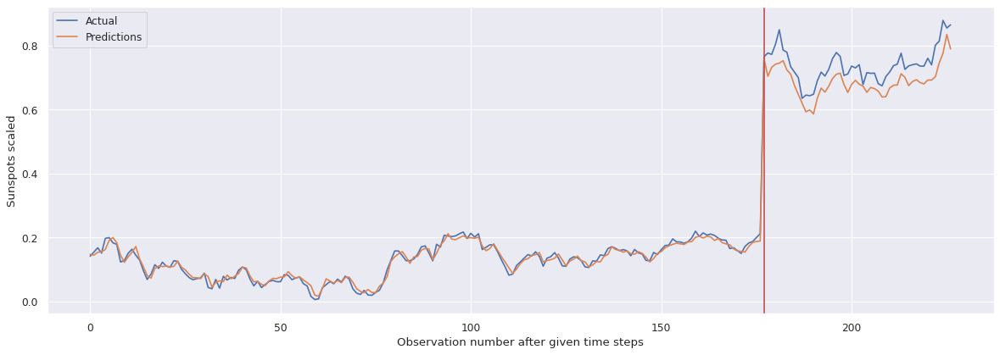

In [59]:
plot_result(Y_train, Y_test[:50], train_predictions, test_predictions[:50])

In [60]:
# Plot the validation and training curves separately
def plot_loss_curves(history):
  """
  Returns separate loss curves for training and validation metrics.
  """
  loss = history.history["loss"]
  val_loss = history.history["val_loss"]

  rmse = history.history["root_mean_squared_error"]
  val_rmse = history.history["val_root_mean_squared_error"]

  epochs = range(len(history.history["loss"])) # how many epochs did we run for?

  # Plot loss
  plt.plot(epochs, loss, label="training_loss")
  plt.plot(epochs, val_loss, label="val_loss")
  plt.title("loss")
  plt.xlabel("epochs")
  plt.legend()

  # Plot accuracy
  plt.figure()
  plt.plot(epochs, rmse, label="training_rmse")
  plt.plot(epochs, val_rmse, label="val_rmse")
  plt.title("RMSE")
  plt.xlabel("epochs")
  plt.legend();

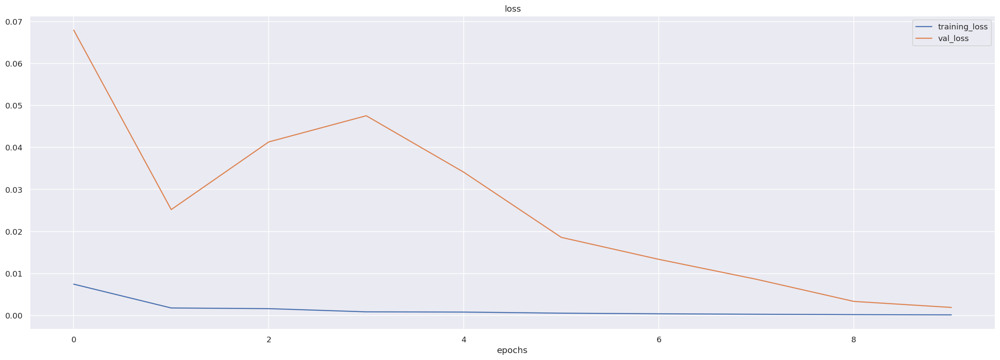

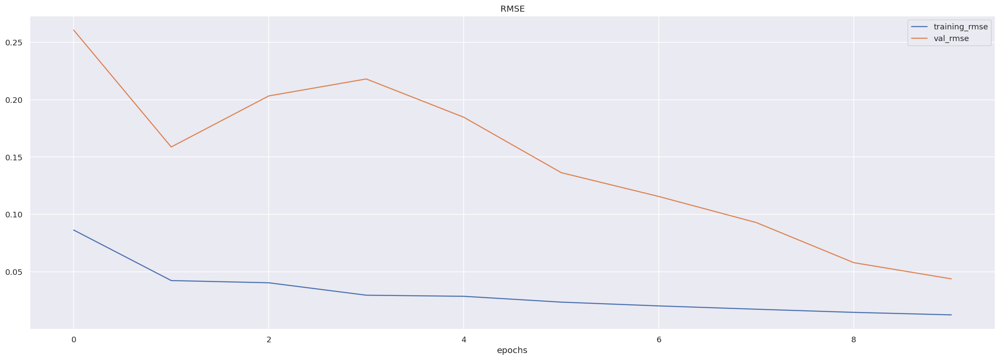

In [61]:
plot_loss_curves(history)

###**Interpretation: the results offered by this model are satisfactory but it deserves to be improved by adding more hidden layers and hidden units**

### 6. (Optional) Rebuilding of  different LSTM models with different parameters (number of LSTM cells, hidden units, hidden layers ...)

###**I will make manual tests to see the evolution of my model to frame it and then to find the right hyperparameters I will use Setting hyperparameters with keras tune**

###Model 0 : dense_layers = 3
###activ = ['relu','relu', 'linear']
###dense_units=[32,8, 1]
###lstm_units = 128

In [34]:
dense_layers = 3
activ = ['relu','relu', 'linear']
dense_units=[32,8, 1]
lstm_units = 128


model = Simple_LSTM(hidden_units=lstm_units, 
                    dense_layers=dense_layers,
                    dense_units=dense_units,
                    input_shape=X_train.shape[1:],
                    activations = activ)

history = model.fit(X_train, Y_train, validation_data=(X_val, Y_val), epochs=10)

Epoch 1/10
6/6 [==============================] - 3s 167ms/step - loss: 0.0066 - root_mean_squared_error: 0.0814 - val_loss: 0.0242 - val_root_mean_squared_error: 0.1556
Epoch 2/10
6/6 [==============================] - 0s 20ms/step - loss: 0.0024 - root_mean_squared_error: 0.0493 - val_loss: 0.0247 - val_root_mean_squared_error: 0.1570
Epoch 3/10
6/6 [==============================] - 0s 19ms/step - loss: 8.9535e-04 - root_mean_squared_error: 0.0299 - val_loss: 0.0474 - val_root_mean_squared_error: 0.2177
Epoch 4/10
6/6 [==============================] - 0s 19ms/step - loss: 9.2307e-04 - root_mean_squared_error: 0.0304 - val_loss: 0.0201 - val_root_mean_squared_error: 0.1416
Epoch 5/10
6/6 [==============================] - 0s 19ms/step - loss: 5.1940e-04 - root_mean_squared_error: 0.0228 - val_loss: 0.0082 - val_root_mean_squared_error: 0.0903
Epoch 6/10
6/6 [==============================] - 0s 17ms/step - loss: 3.4009e-04 - root_mean_squared_error: 0.0184 - val_loss: 0.0116 - val_r

In [35]:
train_predictions = model.predict(X_train).flatten()
test_predictions = model.predict(X_test).flatten()
train_predict = pd.DataFrame(data={'Train Predictions':train_predictions, 'Actuals':Y_train})
train_predict

2/2 [==============================] - 0s 11ms/step


,Train Predictions,Actuals
0,0.154515,0.141011
1,0.151408,0.154219
2,0.162077,0.167554
3,0.163362,0.150925
4,0.172089,0.197042
...,...,...
172,0.162587,0.171924
173,0.181732,0.182599
174,0.195139,0.187128
175,0.198263,0.199322


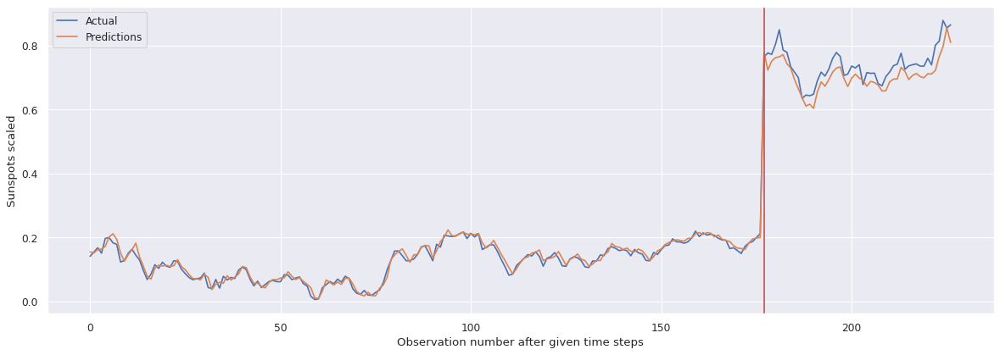

In [36]:
plot_result(Y_train, Y_test[:50], train_predictions, test_predictions[:50])


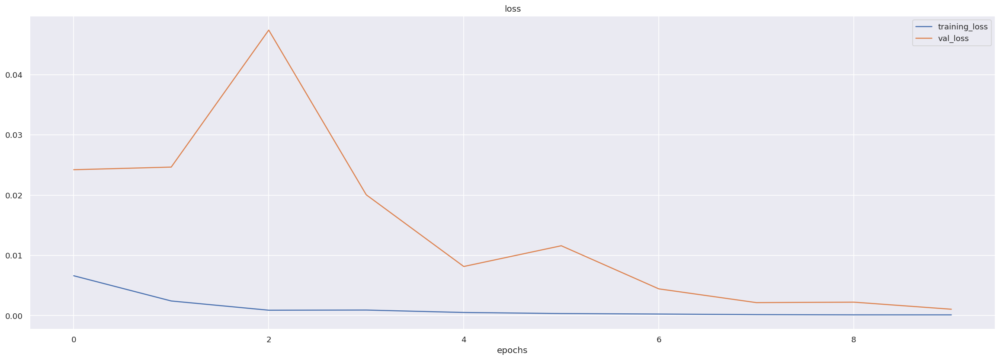

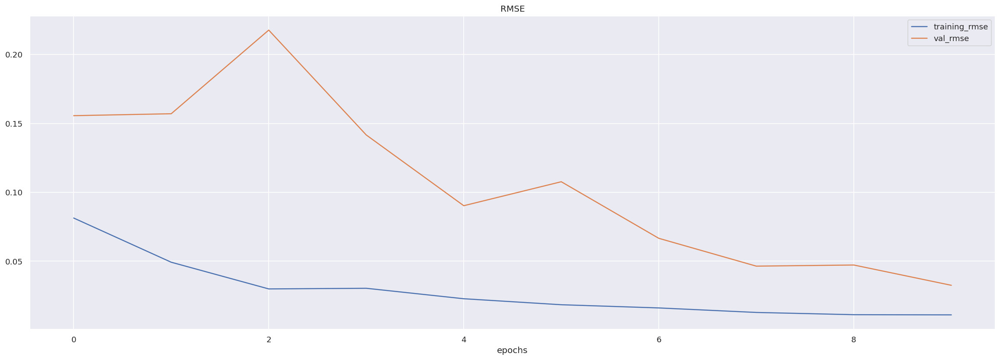

In [37]:
plot_loss_curves(history)

###- Model 1 : Compared to the model of the previous question I will change : lstm_units = 64 and activ = ['relu', 'linear', 'linear'] (linear instead of relu) with 10 epochs for the fit


In [38]:
dense_layers = 3
activ = ['relu','linear', 'linear']
dense_units=[32,8, 1]
lstm_units = 64


model = Simple_LSTM(hidden_units=lstm_units, 
                    dense_layers=dense_layers,
                    dense_units=dense_units,
                    input_shape=X_train.shape[1:],
                    activations = activ)

history = model.fit(X_train, Y_train, validation_data=(X_val, Y_val), epochs=10)
train_predictions = model.predict(X_train).flatten()
test_predictions = model.predict(X_test).flatten()
train_predict = pd.DataFrame(data={'Train Predictions':train_predictions, 'Actuals':Y_train})
train_predict

Epoch 1/10
6/6 [==============================] - 3s 124ms/step - loss: 0.0080 - root_mean_squared_error: 0.0896 - val_loss: 0.0646 - val_root_mean_squared_error: 0.2542
Epoch 2/10
6/6 [==============================] - 0s 16ms/step - loss: 0.0022 - root_mean_squared_error: 0.0472 - val_loss: 0.0321 - val_root_mean_squared_error: 0.1792
Epoch 3/10
6/6 [==============================] - 0s 17ms/step - loss: 0.0014 - root_mean_squared_error: 0.0369 - val_loss: 0.0577 - val_root_mean_squared_error: 0.2402
Epoch 4/10
6/6 [==============================] - 0s 13ms/step - loss: 0.0011 - root_mean_squared_error: 0.0327 - val_loss: 0.0510 - val_root_mean_squared_error: 0.2259
Epoch 5/10
6/6 [==============================] - 0s 15ms/step - loss: 6.4749e-04 - root_mean_squared_error: 0.0254 - val_loss: 0.0248 - val_root_mean_squared_error: 0.1574
Epoch 6/10
6/6 [==============================] - 0s 13ms/step - loss: 4.9908e-04 - root_mean_squared_error: 0.0223 - val_loss: 0.0195 - val_root_mean

,Train Predictions,Actuals
0,0.149793,0.141011
1,0.146759,0.154219
2,0.157149,0.167554
3,0.158387,0.150925
4,0.166926,0.197042
...,...,...
172,0.157642,0.171924
173,0.176852,0.182599
174,0.190991,0.187128
175,0.194369,0.199322


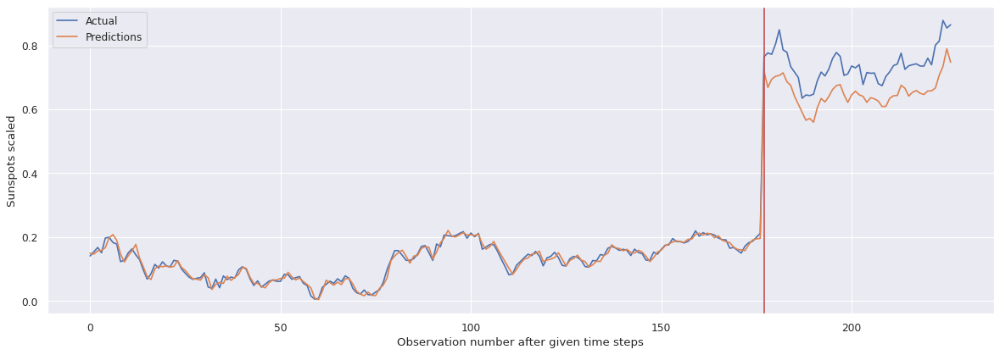

In [39]:
plot_result(Y_train, Y_test[:50], train_predictions, test_predictions[:50])

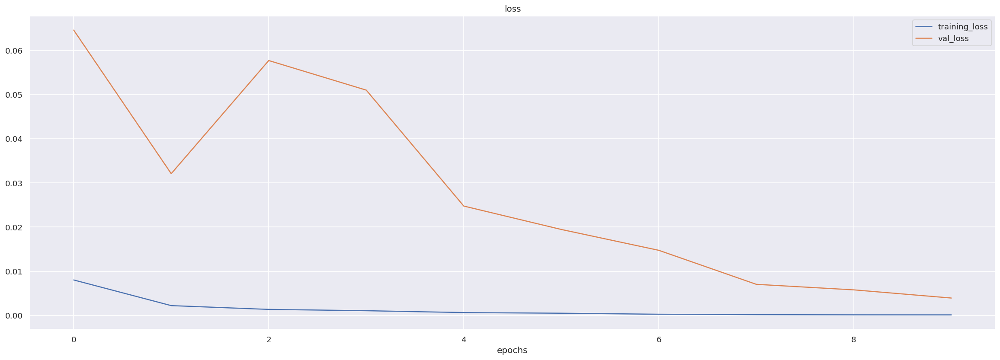

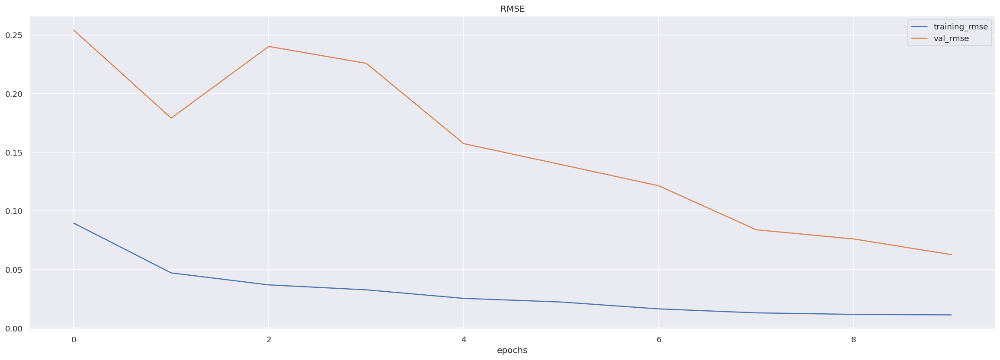

In [40]:
plot_loss_curves(history)

###**- Interpretation: The changes I made to the activation function and lstm_units without the model 1 lowered the performance so I have to reframe my choices to improve the performance and that from epoch 8 the algorithm starts to converge**

##Modele 2:I will use dense_layers = 2 and lstm_units = 128 with only 8 epochs

In [44]:
dense_layers = 2
activ = ['relu','linear']
dense_units=[64, 1]
lstm_units = 128


model = Simple_LSTM(hidden_units=lstm_units, 
                    dense_layers=dense_layers,
                    dense_units=dense_units,
                    input_shape=X_train.shape[1:],
                    activations = activ)

history = model.fit(X_train, Y_train, validation_data=(X_val, Y_val), epochs=8)

train_predictions = model.predict(X_train).flatten()
test_predictions = model.predict(X_test).flatten()
train_predict = pd.DataFrame(data={'Train Predictions':train_predictions, 'Actuals':Y_train})
train_predict



Epoch 1/8
6/6 [==============================] - 2s 112ms/step - loss: 0.0058 - root_mean_squared_error: 0.0763 - val_loss: 0.0176 - val_root_mean_squared_error: 0.1328
Epoch 2/8
6/6 [==============================] - 0s 18ms/step - loss: 0.0022 - root_mean_squared_error: 0.0465 - val_loss: 0.0277 - val_root_mean_squared_error: 0.1663
Epoch 3/8
6/6 [==============================] - 0s 22ms/step - loss: 9.2206e-04 - root_mean_squared_error: 0.0304 - val_loss: 0.0331 - val_root_mean_squared_error: 0.1819
Epoch 4/8
6/6 [==============================] - 0s 18ms/step - loss: 5.1852e-04 - root_mean_squared_error: 0.0228 - val_loss: 0.0081 - val_root_mean_squared_error: 0.0901
Epoch 5/8
6/6 [==============================] - 0s 18ms/step - loss: 3.6586e-04 - root_mean_squared_error: 0.0191 - val_loss: 0.0087 - val_root_mean_squared_error: 0.0933
Epoch 6/8
6/6 [==============================] - 0s 19ms/step - loss: 2.6520e-04 - root_mean_squared_error: 0.0163 - val_loss: 0.0043 - val_root_me

,Train Predictions,Actuals
0,0.143568,0.141011
1,0.141564,0.154219
2,0.151777,0.167554
3,0.152383,0.150925
4,0.161707,0.197042
...,...,...
172,0.152333,0.171924
173,0.170606,0.182599
174,0.184059,0.187128
175,0.187297,0.199322


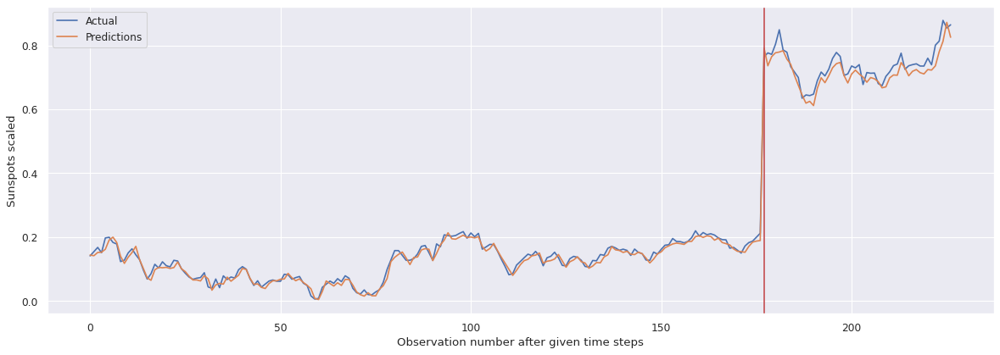

In [45]:
plot_result(Y_train, Y_test[:50], train_predictions, test_predictions[:50])

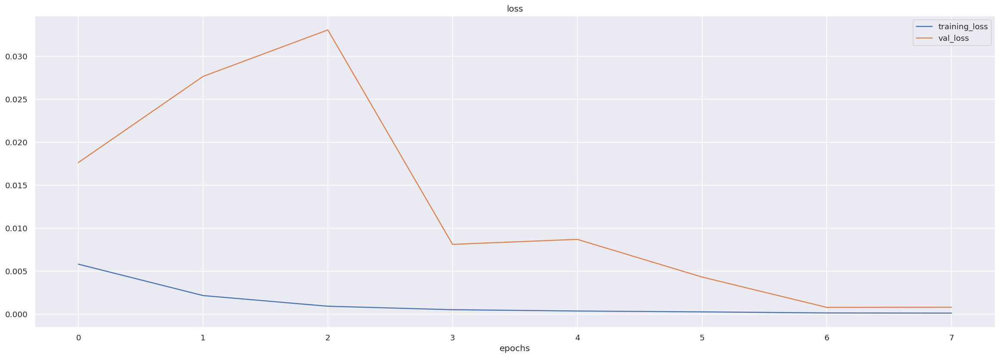

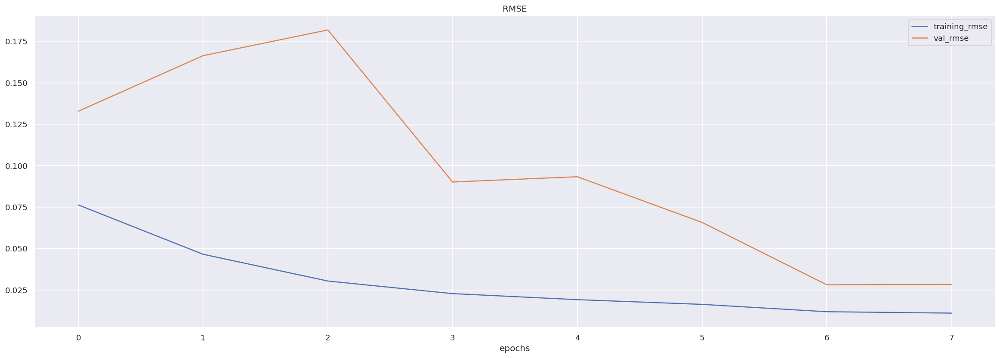

In [46]:
plot_loss_curves(history)

###**Interpretation: this model offers very satisfactory results and that it converges from epoch 7**

##- Model 3: I will keep in this model 2 dense_layers but only with dense_units=[32, 1] and activ = ['linear','linear']

In [47]:
dense_layers = 2
activ = ['linear','linear']
dense_units=[32, 1]
lstm_units = 128


model = Simple_LSTM(hidden_units=lstm_units, 
                    dense_layers=dense_layers,
                    dense_units=dense_units,
                    input_shape=X_train.shape[1:],
                    activations = activ)

history = model.fit(X_train, Y_train, validation_data=(X_val, Y_val), epochs=8)

train_predictions = model.predict(X_train).flatten()
test_predictions = model.predict(X_test).flatten()
train_predict = pd.DataFrame(data={'Train Predictions':train_predictions, 'Actuals':Y_train})
train_predict


Epoch 1/8
6/6 [==============================] - 3s 124ms/step - loss: 0.0060 - root_mean_squared_error: 0.0772 - val_loss: 0.0106 - val_root_mean_squared_error: 0.1030
Epoch 2/8
6/6 [==============================] - 0s 22ms/step - loss: 0.0025 - root_mean_squared_error: 0.0501 - val_loss: 0.0370 - val_root_mean_squared_error: 0.1925
Epoch 3/8
6/6 [==============================] - 0s 23ms/step - loss: 0.0012 - root_mean_squared_error: 0.0342 - val_loss: 0.0399 - val_root_mean_squared_error: 0.1998
Epoch 4/8
6/6 [==============================] - 0s 19ms/step - loss: 7.0663e-04 - root_mean_squared_error: 0.0266 - val_loss: 0.0113 - val_root_mean_squared_error: 0.1063
Epoch 5/8
6/6 [==============================] - 0s 18ms/step - loss: 5.3252e-04 - root_mean_squared_error: 0.0231 - val_loss: 0.0072 - val_root_mean_squared_error: 0.0848
Epoch 6/8
6/6 [==============================] - 0s 21ms/step - loss: 2.5755e-04 - root_mean_squared_error: 0.0160 - val_loss: 0.0075 - val_root_mean_s

,Train Predictions,Actuals
0,0.150100,0.141011
1,0.148243,0.154219
2,0.158511,0.167554
3,0.159104,0.150925
4,0.168305,0.197042
...,...,...
172,0.159033,0.171924
173,0.177276,0.182599
174,0.190778,0.187128
175,0.193842,0.199322


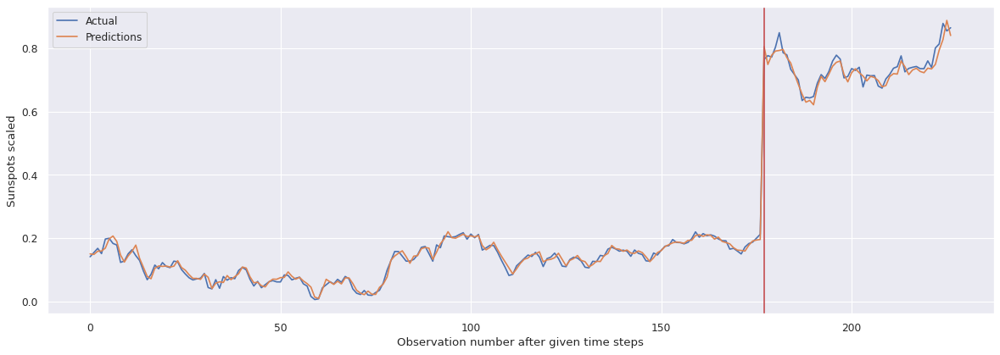

In [48]:
plot_result(Y_train, Y_test[:50], train_predictions, test_predictions[:50])

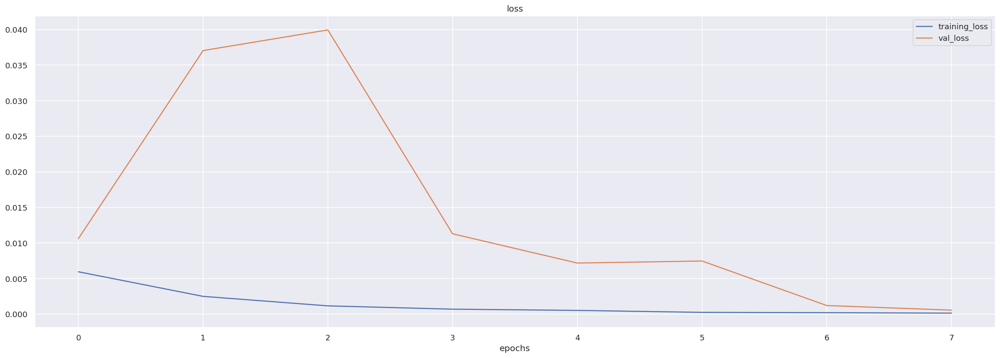

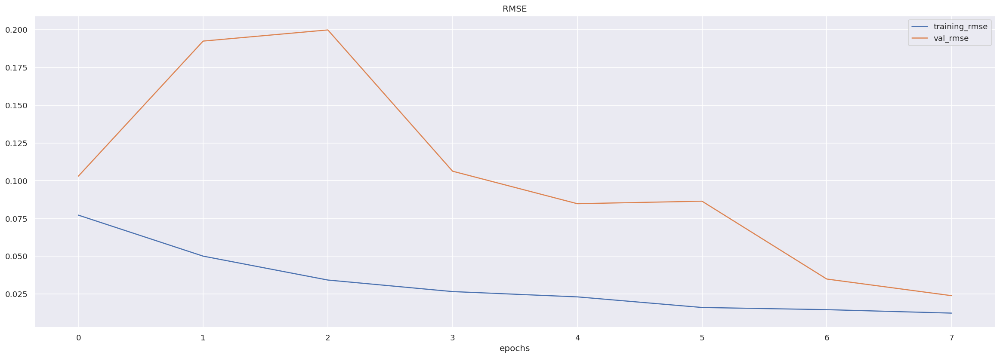

In [49]:
plot_loss_curves(history)

###**-Interpretation: This model also offers very satisfactory results and it converges after 7 epochs even if it is a simple model**



##**Hyperparameter Tuning with Keras Tuner**



##I will take advantage of the observations made before to reframe my hyperparameter search field (I will make a serch on the number of dense layer, the activation function and the lerning rate) and I added a drop out.

In [ ]:
# Load the TensorBoard notebook extension
%load_ext tensorboard

In [ ]:
import pathlib
import shutil
import tempfile

from tensorflow.python.keras.callbacks import TensorBoard

logdir = pathlib.Path(tempfile.mkdtemp())/"tensorboard_logs"
shutil.rmtree(logdir, ignore_errors=True)

In [ ]:
pip install -q -U keras-tuner

     |████████████████████████████████| 135 kB 14.2 MB/s 
     |████████████████████████████████| 1.6 MB 39.5 MB/s 


In [ ]:
def model_builder(hp):
  model = tf.keras.models.Sequential()
  model.add(tf.keras.layers.InputLayer(X_train.shape[1:]))
  model.add(tf.keras.layers.LSTM(128))
  model.add(tf.keras.layers.Dropout(0.2))

  hp_activation = hp.Choice('activation', values=['relu', 'linear'])
  hp_layer_1 = hp.Int('layer_1', min_value=32, max_value=64, step=32)
  hp_layer_2 = hp.Int('layer_2', min_value=1, max_value=200, step=50)
  hp_learning_rate = hp.Choice('learning_rate', values=[1e-2, 1e-3, 1e-4])

  model.add(tf.keras.layers.Dense(units=hp_layer_1, activation=hp_activation))
  model.add(tf.keras.layers.Dense(units=hp_layer_2, activation=hp_activation))
  model.add(tf.keras.layers.Dense(units=1, activation='linear'))
  #model.add(tf.keras.layers.Flatten())
  

  model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=hp_learning_rate),
                loss='mse',
                metrics=[RootMeanSquaredError()])
  
  
  return model

In [ ]:
import keras_tuner as kt

tuner = kt.Hyperband(model_builder,
                     objective='val_loss',
                     max_epochs=5,
                     factor=3,
                     directory='dir',
                     project_name='x')

In [ ]:
tuner.search(X_train, Y_train, validation_data=(X_val, Y_val), epochs=5 )

In [ ]:
best_hps = tuner.get_best_hyperparameters(num_trials=1)[0]
best_hps

In [ ]:
model = tuner.hypermodel.build(best_hps)
history = model.fit(X_train, Y_train, validation_data=(X_val, Y_val), epochs=8 , callbacks=[
                               tf.keras.callbacks.TensorBoard(logdir)])

Epoch 1/8
6/6 [==============================] - 2s 107ms/step - loss: 0.0433 - root_mean_squared_error: 0.2082 - val_loss: 0.1779 - val_root_mean_squared_error: 0.4217
Epoch 2/8
6/6 [==============================] - 0s 18ms/step - loss: 0.0060 - root_mean_squared_error: 0.0773 - val_loss: 0.1338 - val_root_mean_squared_error: 0.3657
Epoch 3/8
6/6 [==============================] - 0s 19ms/step - loss: 0.0038 - root_mean_squared_error: 0.0618 - val_loss: 0.1137 - val_root_mean_squared_error: 0.3371
Epoch 4/8
6/6 [==============================] - 0s 18ms/step - loss: 0.0018 - root_mean_squared_error: 0.0429 - val_loss: 0.0744 - val_root_mean_squared_error: 0.2728
Epoch 5/8
6/6 [==============================] - 0s 16ms/step - loss: 0.0011 - root_mean_squared_error: 0.0337 - val_loss: 0.0194 - val_root_mean_squared_error: 0.1392
Epoch 6/8
6/6 [==============================] - 0s 16ms/step - loss: 5.3622e-04 - root_mean_squared_error: 0.0232 - val_loss: 9.7192e-04 - val_root_mean_squar

In [ ]:
import pandas as pd

pd.DataFrame(history.history)

,loss,root_mean_squared_error,val_loss,val_root_mean_squared_error
0,0.043344,0.208191,0.177857,0.421731
1,0.005983,0.077348,0.133760,0.365733
2,0.003814,0.061754,0.113663,0.337140
3,0.001842,0.042924,0.074407,0.272777
4,0.001134,0.033675,0.019381,0.139217
5,0.000536,0.023156,0.000972,0.031176
6,0.000452,0.021250,0.003534,0.059447
7,0.000249,0.015768,0.011891,0.109045


In [ ]:
%load_ext tensorboard
%tensorboard --logdir {logdir}

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6006 (pid 938), started 0:13:37 ago. (Use '!kill 938' to kill it.)

<IPython.core.display.Javascript object>

###**Interpretation : From the tensorboard I see that the best model starts to converge from the 4 epochs**

In [ ]:
train_predictions = model.predict(X_train).flatten()
test_predictions = model.predict(X_test).flatten()
train_predict = pd.DataFrame(data={'Train Predictions':train_predictions, 'Actuals':Y_train})
train_predict


2/2 [==============================] - 0s 8ms/step


,Train Predictions,Actuals
0,0.137444,0.141011
1,0.136398,0.154219
2,0.145954,0.167554
3,0.145090,0.150925
4,0.154332,0.197042
...,...,...
172,0.145689,0.171924
173,0.161327,0.182599
174,0.172305,0.187128
175,0.175171,0.199322


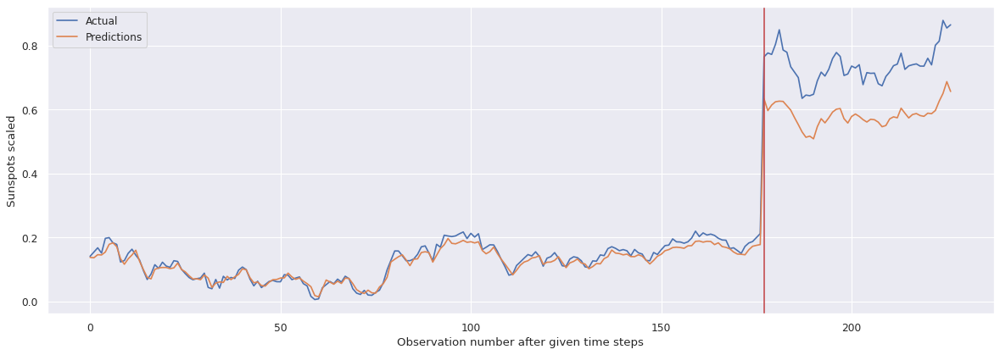

In [ ]:
plot_result(Y_train, Y_test[:50], train_predictions, test_predictions[:50])

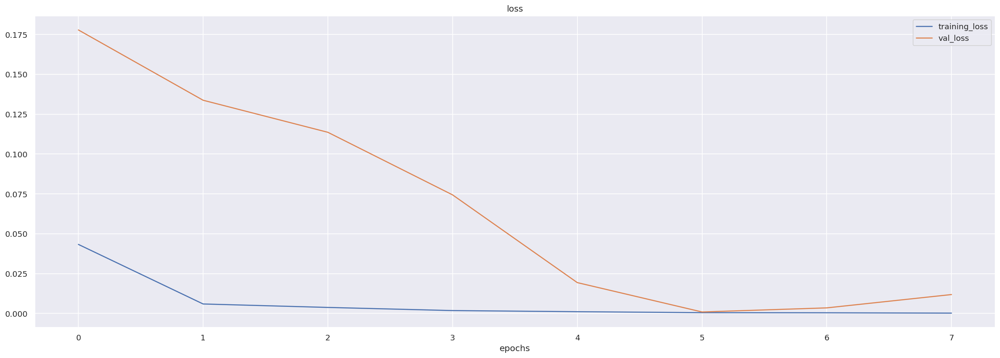

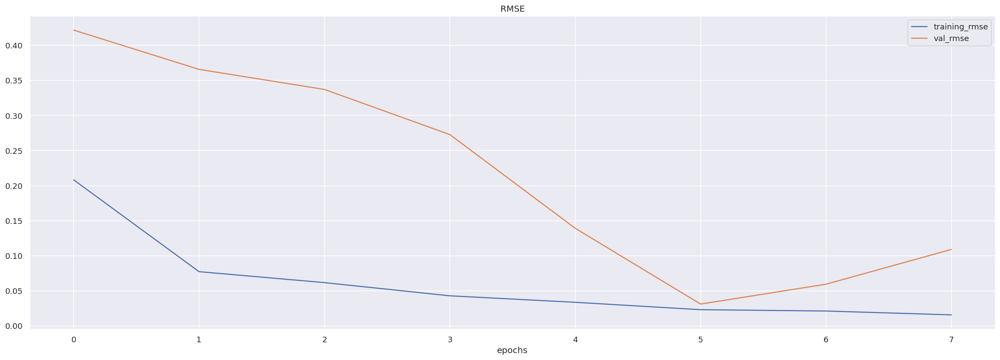

In [ ]:
plot_loss_curves(history)

###**Interpretation: my model reached the minimum at 5 epochs and then it started to diverge so I have to redo the fit only at 5 epochs**

In [ ]:
model = tuner.hypermodel.build(best_hps)
history = model.fit(X_train, Y_train, validation_data=(X_val, Y_val), epochs=6, callbacks=[
                               tf.keras.callbacks.TensorBoard(logdir)])

Epoch 1/6
6/6 [==============================] - 3s 111ms/step - loss: 0.0665 - root_mean_squared_error: 0.2578 - val_loss: 0.1088 - val_root_mean_squared_error: 0.3299
Epoch 2/6
6/6 [==============================] - 0s 20ms/step - loss: 0.0078 - root_mean_squared_error: 0.0886 - val_loss: 0.1414 - val_root_mean_squared_error: 0.3760
Epoch 3/6
6/6 [==============================] - 0s 18ms/step - loss: 0.0055 - root_mean_squared_error: 0.0740 - val_loss: 0.0629 - val_root_mean_squared_error: 0.2507
Epoch 4/6
6/6 [==============================] - 0s 18ms/step - loss: 0.0023 - root_mean_squared_error: 0.0475 - val_loss: 0.0271 - val_root_mean_squared_error: 0.1645
Epoch 5/6
6/6 [==============================] - 0s 17ms/step - loss: 0.0011 - root_mean_squared_error: 0.0334 - val_loss: 0.0092 - val_root_mean_squared_error: 0.0958
Epoch 6/6
6/6 [==============================] - 0s 20ms/step - loss: 9.1606e-04 - root_mean_squared_error: 0.0303 - val_loss: 0.0028 - val_root_mean_squared_e

In [ ]:
train_predictions = model.predict(X_train).flatten()
test_predictions = model.predict(X_test).flatten()
train_predict = pd.DataFrame(data={'Train Predictions':train_predictions, 'Actuals':Y_train})

2/2 [==============================] - 0s 8ms/step


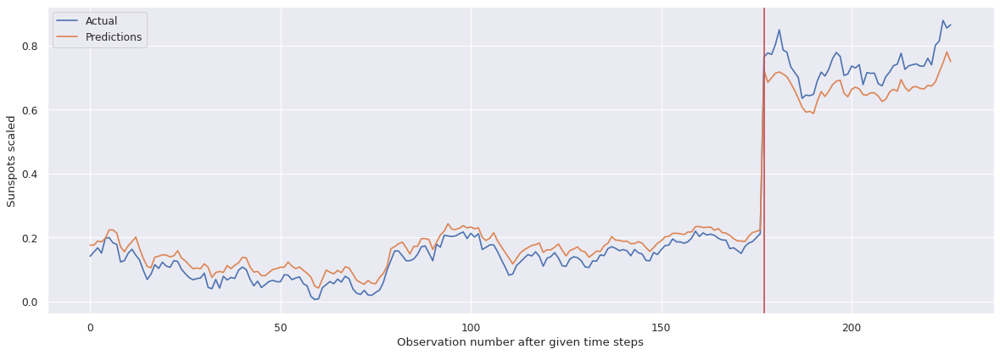

In [ ]:
plot_result(Y_train, Y_test[:50], train_predictions, test_predictions[:50])

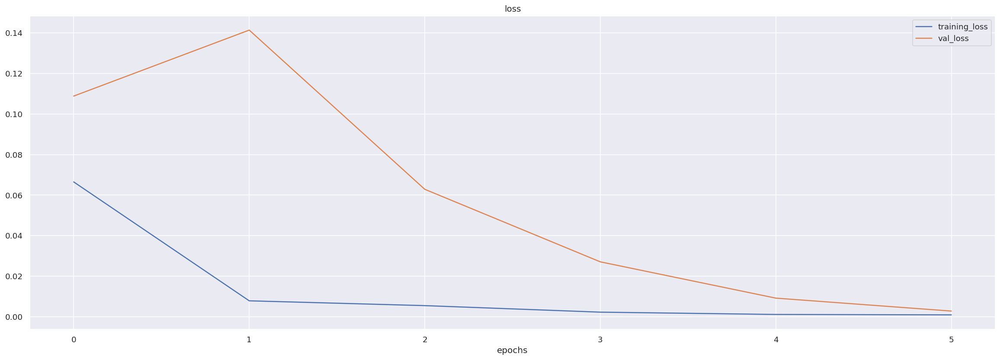

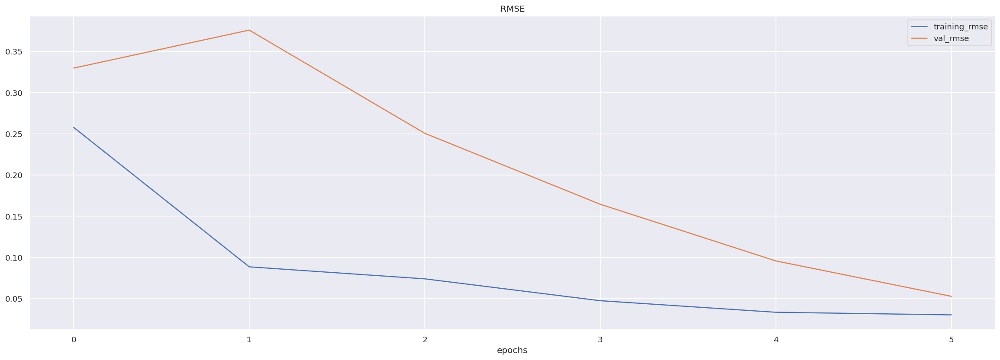

In [ ]:
plot_loss_curves(history)

###**Final interpretation : By doing the manual test I was able to reframe my search field for hyperparameters and by urilizing keras.tuner I was able to search them using HyperParameters and tensorboard for visualization. As a result the best model I found from all the experience is : Model 3:  but only with dense_units=[32, 1] , activ = ['linear','linear'] and lstm_units = 128**